In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import to_rgba
from pathlib import Path
import numpy as np
import pandas as pd

from aind_hcr_data_loader.codeocean_utils import (
    MouseRecord,
    attach_mouse_record_to_workstation,
    print_attach_results,
)
from aind_hcr_data_loader.hcr_dataset import create_hcr_dataset_from_schema
from aind_hcr_data_loader.pairwise_dataset import create_pairwise_unmixing_dataset

import aind_hcr_qc.viz as viz
from aind_hcr_qc.viz.intergrated_datasets import plot_intensity_violins
from aind_hcr_qc.viz.single_cell_unmixing import (
    plot_spot_projection,
    plot_spot_measure_distributions,
    plot_cell_qc,
    plot_spot_nn_distances,
    plot_adjacent_channel_scatter,
    fig_single_cell_unmixing_mg,
)

from aind_hcr_qc.viz.spot_detection import (
    annotate_spots_df,
    plot_removal_metric_distributions,
)
from aind_hcr_qc.constants import Z1_CHANNEL_CMAP_VIBRANT

In [2]:
# notebook setup
data_dir = Path('/root/capsule/data')
bucket_name = "aind-open-data"

# notebook configuration
%matplotlib inline
%load_ext autoreload
%autoreload 2


In [3]:
# ── configuration ────────────────────────────────────────────────────────────
MOUSE_ID = "782149"
  # use a mouse that has a pairwise_unmixing derived asset
CATALOG_PATH = Path(f"/src/ophys-mfish-dataset-catalog/mice/{MOUSE_ID}.json")
DATA_DIR     = Path("/root/capsule/data")
OUTPUT_DIR = Path(f"/root/capsule/scratch/single_cell_unmixing/{MOUSE_ID}")

# ── attach & load ────────────────────────────────────────────────────────────
record  = MouseRecord.from_json_file(CATALOG_PATH)
results = attach_mouse_record_to_workstation(record)
print_attach_results(results)

dataset = create_hcr_dataset_from_schema(CATALOG_PATH, DATA_DIR)
dataset.summary()

# ── pairwise unmixing (optional) ─────────────────────────────────────────────
# The pairwise asset name lives in derived_assets["pairwise_unmixing"] when present.
pairwise_asset_name = record.derived_assets.get("pairwise_unmixing")

if pairwise_asset_name is not None:
    pairwise_asset_path = DATA_DIR / pairwise_asset_name
    # Some pipeline outputs nest data under a "pairwise_unmixing" subfolder
    if (pairwise_asset_path / "pairwise_unmixing").exists():
        pairwise_asset_path = pairwise_asset_path / "pairwise_unmixing"
    pw_ds = create_pairwise_unmixing_dataset(
        mouse_id=MOUSE_ID,
        pairwise_asset_path=pairwise_asset_path,
        source_dataset=dataset,   # delegates zarr / segmentation calls
    )
    pw_ds.summary()
else:
    print("No pairwise_unmixing asset found in catalog record — skipping.")


  [rounds.R1]  HCR_782149_2025-11-05_13-00-00_processed_2025-11-10_20-37-29  →  ✓ attached
  [rounds.R2]  HCR_782149_2025-11-12_13-00-00_processed_2025-11-13_22-04-32  →  ✓ attached
  [rounds.R3]  HCR_782149_2025-11-19_13-00-00_processed_2025-11-21_01-27-24  →  ✓ attached
  [rounds.R4]  HCR_782149_2025-12-04_13-00-00_processed_2025-12-05_22-31-35  →  ✓ attached
  [rounds.R5]  HCR_782149_2025-12-11_13-00-00_processed_2025-12-12_23-45-26  →  ✓ attached
  [derived_assets.roi_shape_metrics]  HCR_782149_2025-11-05_13-00-00_roi-shape-metrics  →  ✓ attached
  [derived_assets.cell_typing]  HCR_782149_cell-typing_2026-03-08_12-00-00  →  ✓ attached
  [derived_assets.pairwise_unmixing]  HCR_782149_pairwise-unmixing_2026-05-14_17-43-14  →  ✓ attached
[DEBUG get_spot_files] key=R1 round_num=1
[DEBUG get_spot_files] folder_path=/root/capsule/data/HCR_782149_2025-11-05_13-00-00_processed_2025-11-10_20-37-29/image_spot_spectral_unmixing exists=True
[DEBUG get_spot_files] .pkl files in folder: ['unmixe

/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:2500: UserWarning: [get_spot_files] R1: no unmixed_spots_R1*.pkl found; falling back to R-1 file: unmixed_spots_R-1_minDist_3.pkl
  _warnings.warn(
/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:2509: UserWarning: [get_spot_files] R1: no mixed_spots_R1.pkl found; falling back to R-1 file: mixed_spots_R-1.pkl
  _warnings.warn(


mouse_id: 782149
Could not load metadata for mouse 782149
Cell-typing asset attached: CellTypingFiles(asset='HCR_782149_cell-typing_2026-03-08_12-00-00', basic_results=✓, h5ad=✓)
HCR Dataset Summary
Mouse ID: 782149
Rounds: R1, R2, R3, R4, R5

Channels by round:
  R1: 594, 405, 488, 561
  R2: 488, 561, 405, 594, 514, 638
  R3: 514, 405, 594, 638, 561, 488
  R4: 405, 594, 488, 514, 561, 638
  R5: 405, 488, 561, 594, 514, 638

Cell-typing: ✓  (CellTypingFiles(asset='HCR_782149_cell-typing_2026-03-08_12-00-00', basic_results=✓, h5ad=✓))

Segmentation files by round:
  R1: resolutions 0, 2, centroids: ✓
  R2: resolutions 0, 2, centroids: ✗
  R3: resolutions 0, 2, centroids: ✗
  R4: resolutions 0, 2, centroids: ✗
  R5: resolutions 0, 2, centroids: ✗

Spot detection files by round:
  R1: channels 561, 594, 488
    561: spots ✓, stats files: 3
    594: spots ✓, stats files: 3
    488: spots ✓, stats files: 3
  R2: channels 488, 638, 594, 561, 514
    488: spots ✓, stats files: 5
    638: spot

In [4]:

# channel display order and fixed colors
CHAN_ORDER  = ["488", "514", "561", "594", "638"]
CHAN_COLORS = {k: v for k, v in Z1_CHANNEL_CMAP_VIBRANT.items() if k in CHAN_ORDER}

# ── load spots (both tables) for this cell ───────────────────────────────────
mixed_all   = pw_ds.load_all_rounds_spots_mp(table_type="mixed_spots",   remove_fg_bg_cols=True)
unmixed_all = pw_ds.load_all_rounds_spots_mp(table_type="unmixed_spots",  remove_fg_bg_cols=True)




Loading mixed_spots for round R1: 782149_R1
Loading mixed_spots for round R2: 782149_R2


Loading mixed_spots for round R5: 782149_R5
Loading mixed_spots for round R3: 782149_R3
Loading mixed_spots for round R4: 782149_R4





Number of mixed_spots: 3.628e+07
Loading unmixed_spots for round R1: 782149_R1
Loading unmixed_spots for round R2: 782149_R2

Loading unmixed_spots for round R3: 782149_R3

Loading unmixed_spots for round R4: 782149_R4
Loading unmixed_spots for round R5: 782149_R5



Number of unmixed_spots: 3.075e+07


# Plot cell qc: MG version 1

/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py

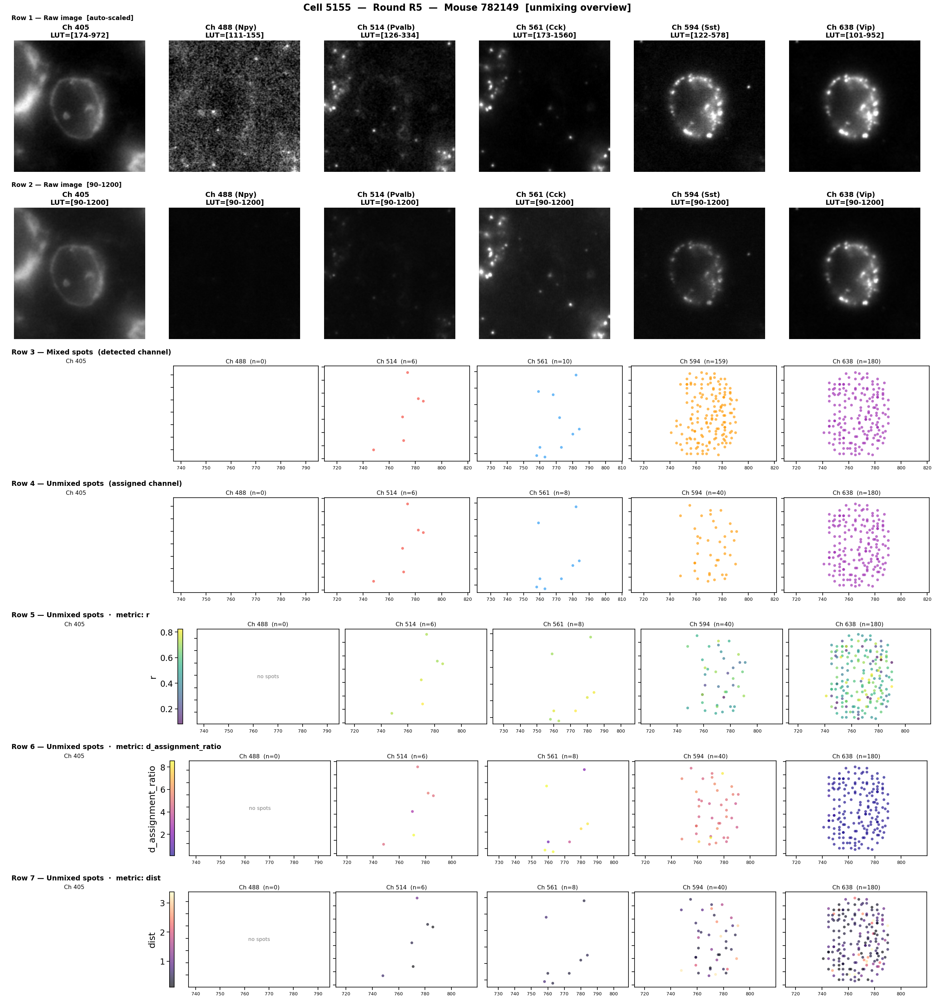

In [5]:
_test_cid = 5155
_test_rk  = "R5"

_mx = mixed_all[(mixed_all["round"] == _test_rk) & (mixed_all["cell_id"] == _test_cid)]
_um = unmixed_all[(unmixed_all["round"] == _test_rk) & (unmixed_all["cell_id"] == _test_cid)]

fig = fig_single_cell_unmixing_mg(
    _mx, _um,
    cell_id=_test_cid, round_key=_test_rk,
    chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
    dataset=dataset,
    fast_plot=False,
    spot_size=30,
)

/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an erro

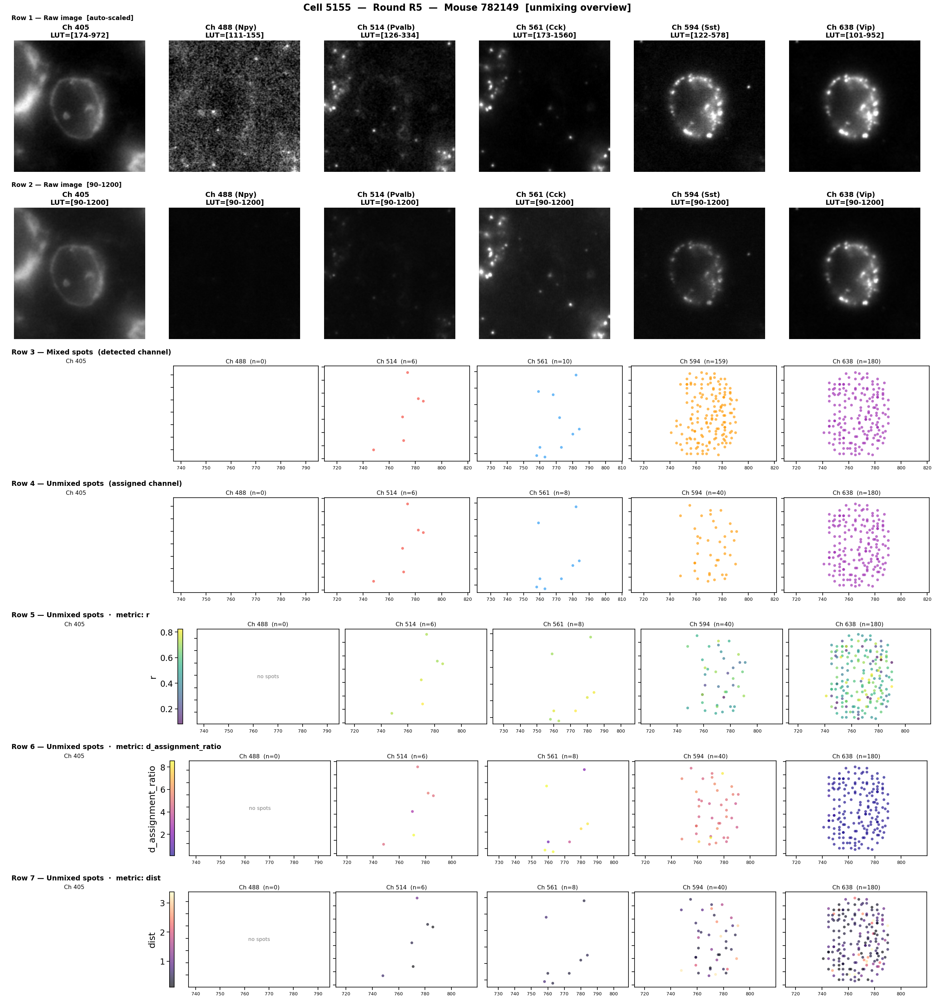

In [23]:
_test_cid = 5155
_test_rk  = "R5"

_mx = mixed_all[(mixed_all["round"] == _test_rk) & (mixed_all["cell_id"] == _test_cid)]
_um = unmixed_all[(unmixed_all["round"] == _test_rk) & (unmixed_all["cell_id"] == _test_cid)]

fig = fig_single_cell_unmixing_mg(
    _mx, _um,
    cell_id=_test_cid, round_key=_test_rk,
    chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
    dataset=dataset,
    fast_plot=False,
    spot_size=30,
)

/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py

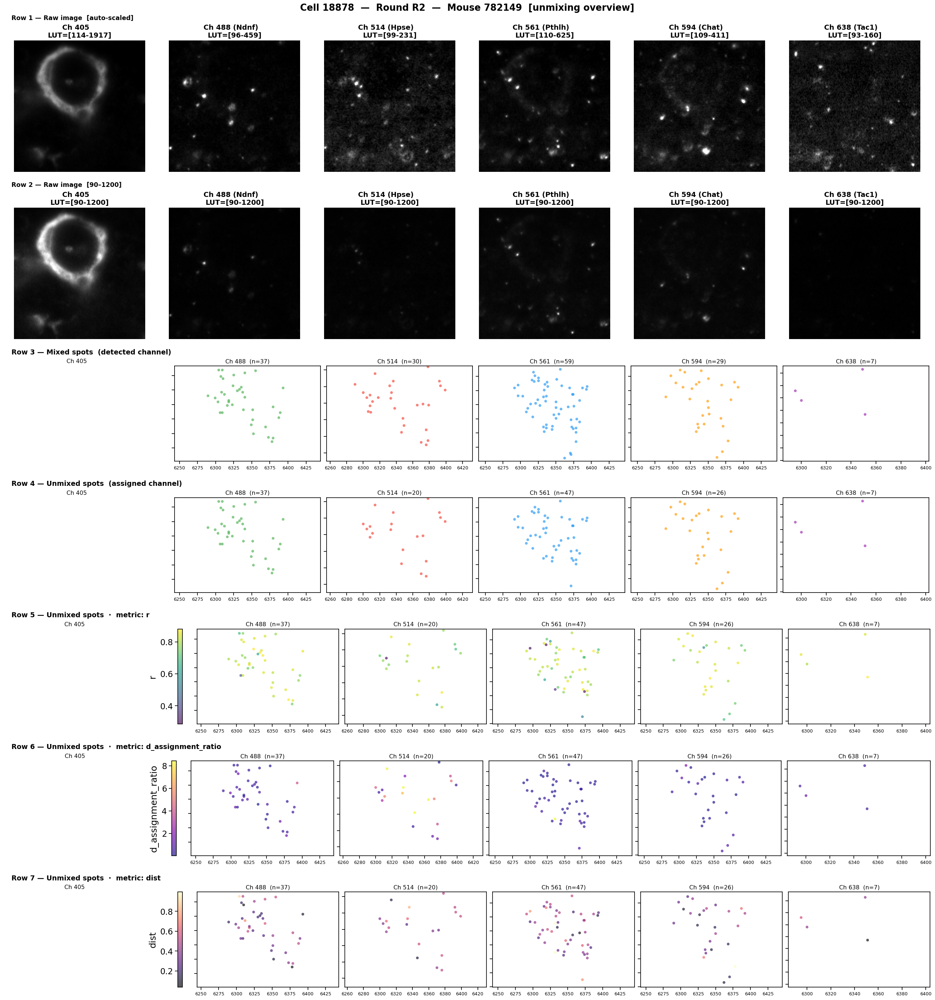

In [5]:


_test_cid = 18878
_test_rk  = "R2"

_mx = mixed_all[(mixed_all["round"] == _test_rk) & (mixed_all["cell_id"] == _test_cid)]
_um = unmixed_all[(unmixed_all["round"] == _test_rk) & (unmixed_all["cell_id"] == _test_cid)]

fig = fig_single_cell_unmixing_mg(
    _mx, _um,
    cell_id=_test_cid, round_key=_test_rk,
    chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
    dataset=dataset,
    fast_plot=False,
    spot_size=30,
)

## Plot single cell MG version 2

In [ ]:
_test_cid = 5155
_test_rk  = "R5"

_mx = mixed_all[(mixed_all["round"] == _test_rk) & (mixed_all["cell_id"] == _test_cid)]
_um = unmixed_all[(unmixed_all["round"] == _test_rk) & (unmixed_all["cell_id"] == _test_cid)]

fig = fig_single_cell_unmixing_mg(
    _mx, _um,
    cell_id=_test_cid, round_key=_test_rk,
    chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
    dataset=dataset,
    fast_plot=False,
    spot_size=30,
)

In [7]:
from aind_hcr_qc.viz.single_cell_unmixing import fig_single_cell_unmixing_mg2

/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)
/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an erro

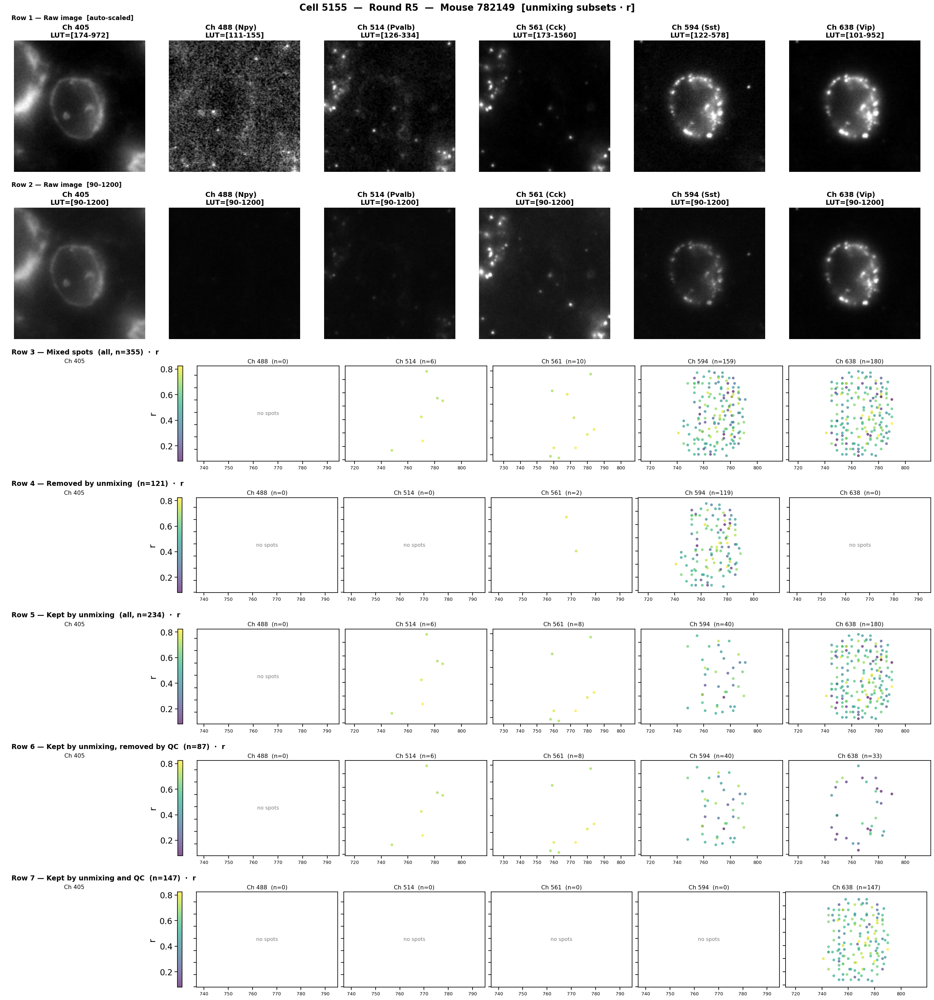

In [8]:
_test_cid = 5155
_test_rk  = "R5"

_mx = mixed_all[(mixed_all["round"] == _test_rk) & (mixed_all["cell_id"] == _test_cid)]
_um = unmixed_all[(unmixed_all["round"] == _test_rk) & (unmixed_all["cell_id"] == _test_cid)]

fig = fig_single_cell_unmixing_mg2(
    _mx, _um,
    cell_id=_test_cid, round_key=_test_rk,
    chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
    dataset=dataset,
    fast_plot=False,
    spot_size=30,
    metric_col = 'r'
)

## Exemplar cell selection (per round)

**Goal**: For each round independently, select a small set of exemplar cells that
cover the full space of unmixing outcomes — from clean cells with almost no
removal, through cells with channel-specific or broad loss, to cells that
demonstrate weak but real signal in each channel.

**Three-step pipeline**:

1. `build_round_cell_summary` — per-cell removal-rate summary for one round
2. `select_round_exemplars` — greedy set-cover sampler with hard channel-coverage constraints
3. `plot_round_exemplar_overview` — per-round QC figure (stacked bar + scatter)

In [ ]:
# ── Step 1: per-cell removal summary for a single round ──────────────────────



In [7]:
# ── Step 2: greedy set-cover exemplar sampler ─────────────────────────────────

# Adjacent channel pairs whose correlated removal is interesting
ADJACENT_PAIRS = [("488", "514"), ("514", "561"), ("561", "594"), ("594", "638")]


def _build_slot_index(summary, chan_order, adjacent_pairs=ADJACENT_PAIRS):
    """
    Return a dict  {cell_id: set_of_slot_strings}  for greedy set-cover.

    Slot types
    ----------
    strong_survivor_{ch}   : cell is strong_survivor in channel ch
    weak_survivor_{ch}     : cell is weak_survivor in channel ch
    clean                  : cell category == clean
    heavy_loss             : cell category == heavy_loss
    adj_pair_{a}_{b}       : both channels a,b have >= 30 % removal
    """
    slot_map = {}
    chans_in_data = [ch for ch in chan_order
                     if f"regime_{ch}" in summary.columns]

    for _, row in summary.iterrows():
        cid = row["cell_id"]
        slots = set()

        # severity category
        if row["category"] == "clean":
            slots.add("clean")
        if row["category"] == "heavy_loss":
            slots.add("heavy_loss")

        # per-channel regime
        for ch in chans_in_data:
            regime = row.get(f"regime_{ch}", "moderate")
            if regime == "strong_survivor":
                slots.add(f"strong_survivor_{ch}")
            elif regime == "weak_survivor":
                slots.add(f"weak_survivor_{ch}")

        # adjacent-pair correlated removal
        for a, b in adjacent_pairs:
            ra = row.get(f"removal_rate_{a}", 0) or 0
            rb = row.get(f"removal_rate_{b}", 0) or 0
            if ra >= 0.30 and rb >= 0.30:
                slots.add(f"adj_pair_{a}_{b}")

        if slots:
            slot_map[cid] = slots

    return slot_map


def select_round_exemplars(summary, chan_order=CHAN_ORDER, max_cells=20):
    """
    Greedy set-cover selection of exemplar cell_ids.

    Returns
    -------
    exemplar_ids : list[int]
        Ordered list of selected cell_ids.
    slot_assignments : dict[int, set[str]]
        Which slots each selected cell fills.
    all_required_slots : set[str]
        The full set of slots we tried to cover.
    """
    chans_in_data = [ch for ch in chan_order
                     if f"regime_{ch}" in summary.columns]

    # define required slots
    required = set()
    required.add("clean")
    required.add("heavy_loss")
    for ch in chans_in_data:
        required.add(f"strong_survivor_{ch}")
        required.add(f"weak_survivor_{ch}")
    for a, b in ADJACENT_PAIRS:
        if a in chans_in_data and b in chans_in_data:
            required.add(f"adj_pair_{a}_{b}")

    slot_map = _build_slot_index(summary, chan_order)

    # greedy set-cover
    remaining = required.copy()
    selected = []
    assignments = {}

    # build a quick lookup: cell_id → n_total for tie-breaking
    ntotal = summary.set_index("cell_id")["n_total"].to_dict()

    while remaining and len(selected) < max_cells:
        best_id, best_new = None, set()
        for cid, slots in slot_map.items():
            if cid in assignments:
                continue
            new = slots & remaining
            if len(new) > len(best_new) or (
                len(new) == len(best_new)
                and len(new) > 0
                and ntotal.get(cid, 0) > ntotal.get(best_id, 0)
            ):
                best_id, best_new = cid, new
        if best_id is None or len(best_new) == 0:
            break  # no more cells can fill remaining slots
        selected.append(best_id)
        assignments[best_id] = best_new
        remaining -= best_new

    # report unfilled slots (can happen if no cell qualifies)
    if remaining:
        print(f"  ⚠ unfilled slots: {remaining}")

    return selected, assignments, required

In [8]:
# ── Step 3: per-round exemplar overview plot ──────────────────────────────────

CAT_ORDER  = ["clean", "broad_loss", "channel_specific_loss", "heavy_loss"]
CAT_COLORS = {
    "clean": "#4dac26",
    "broad_loss": "#f7b731",
    "channel_specific_loss": "#d73027",
    "heavy_loss": "#7b2d8b",
    "other": "#999999",
}
CHAN_PALETTE = {
    "488": "#4CAF50", "514": "#F44336", "561": "#2196F3",
    "594": "#FF9800", "638": "#9C27B0",
}


def plot_round_exemplar_overview(summary, exemplar_ids, slot_assignments,
                                 round_key, chan_order=CHAN_ORDER):
    """
    Two-panel QC figure for one round's exemplar cells.

    Top:    stacked bar — per-channel removal rate for each exemplar,
            grouped by category.
    Bottom: scatter — global removal rate vs total spots,
            all cells in grey, exemplars coloured by category.
    """
    rate_cols = [f"removal_rate_{ch}" for ch in chan_order
                 if f"removal_rate_{ch}" in summary.columns]
    chans = [c.replace("removal_rate_", "") for c in rate_cols]

    # exemplar rows in category → cell_id order
    ex = summary[summary["cell_id"].isin(exemplar_ids)].copy()
    cat_rank = {c: i for i, c in enumerate(CAT_ORDER + ["other"])}
    ex["_cat_rank"] = ex["category"].map(cat_rank).fillna(len(CAT_ORDER))
    ex = ex.sort_values(["_cat_rank", "n_removed"], ascending=[True, False])
    ex["label"] = ex["cell_id"].astype(str)

    n_ex = len(ex)
    if n_ex == 0:
        print(f"No exemplars for {round_key}")
        return

    x = np.arange(n_ex)
    bar_w = 0.6

    fig, (ax_bar, ax_sc) = plt.subplots(
        2, 1, figsize=(max(10, n_ex * 1.1), 9),
        gridspec_kw={"height_ratios": [2, 1.4]},
    )
    fig.suptitle(
        f"{round_key} — exemplar cells: per-channel removal rates",
        fontsize=13, fontweight="bold", y=1.01,
    )

    # ── stacked bar ──────────────────────────────────────────────────────────
    bottoms = np.zeros(n_ex)
    for ch, rc in zip(chans, rate_cols):
        vals = ex[rc].fillna(0).values
        ax_bar.bar(
            x, vals, bottom=bottoms, width=bar_w,
            color=CHAN_PALETTE.get(ch, "grey"), alpha=0.85,
            label=f"Ch {ch}",
        )
        bottoms += vals

    # category boundary lines + labels
    prev_cat = None
    for idx_pos, (_, row) in enumerate(ex.iterrows()):
        cat = row["category"]
        if cat != prev_cat:
            if prev_cat is not None:
                ax_bar.axvline(idx_pos - 0.5, color="black", lw=1, ls="--")
            ax_bar.text(
                idx_pos, 1.04,
                cat.replace("_", " ").title(),
                transform=ax_bar.get_xaxis_transform(),
                fontsize=8, color=CAT_COLORS.get(cat, "grey"),
                fontweight="bold",
            )
            prev_cat = cat

    ax_bar.set_xticks(x)
    ax_bar.set_xticklabels(ex["label"], fontsize=7, rotation=45, ha="right")
    ax_bar.set_ylabel("Per-channel removal rate (stacked)")
    ax_bar.set_ylim(0, min(bottoms.max() * 1.25, 5.5) if n_ex else 5.5)
    ax_bar.set_xlim(-0.6, n_ex - 0.4)
    ax_bar.legend(loc="upper right", fontsize=7, ncol=len(chans), framealpha=0.7)

    # colour x-tick labels by category
    for tick, (_, row) in zip(ax_bar.get_xticklabels(), ex.iterrows()):
        tick.set_color(CAT_COLORS.get(row["category"], "grey"))

    # ── scatter ──────────────────────────────────────────────────────────────
    ax_sc.scatter(
        summary["n_total"], summary["removal_rate_global"],
        c="lightgrey", s=6, alpha=0.4, linewidths=0, zorder=1,
        label="all cells",
    )
    for cat in CAT_ORDER + ["other"]:
        sub = ex[ex["category"] == cat]
        if sub.empty:
            continue
        ax_sc.scatter(
            sub["n_total"], sub["removal_rate_global"],
            c=CAT_COLORS.get(cat, "grey"), s=60, zorder=3,
            edgecolors="black", linewidths=0.5,
            label=cat.replace("_", " ").title(),
        )
        for _, r in sub.iterrows():
            ax_sc.annotate(
                str(int(r.cell_id)),
                (r.n_total, r.removal_rate_global),
                fontsize=6, xytext=(4, 2), textcoords="offset points",
            )

    ax_sc.set_xlabel("Total mixed spots in cell")
    ax_sc.set_ylabel("Global removal rate")
    ax_sc.legend(fontsize=8, loc="upper right", framealpha=0.8)
    ax_sc.set_ylim(-0.02, 1.05)

    plt.tight_layout()
    plt.show()


def print_exemplar_table(summary, exemplar_ids, slot_assignments,
                         chan_order=CHAN_ORDER):
    """Compact printout of selected exemplars and the slots they fill."""
    chans_in_data = [ch for ch in chan_order
                     if f"regime_{ch}" in summary.columns]
    ex = summary[summary["cell_id"].isin(exemplar_ids)].copy()

    display_cols = (
        ["cell_id", "category", "n_total", "n_removed", "removal_rate_global"]
        + [f"removal_rate_{ch}" for ch in chans_in_data
           if f"removal_rate_{ch}" in ex.columns]
        + [f"regime_{ch}" for ch in chans_in_data
           if f"regime_{ch}" in ex.columns]
    )
    ex = ex[[c for c in display_cols if c in ex.columns]]
    ex["slots_filled"] = ex["cell_id"].map(
        lambda cid: ", ".join(sorted(slot_assignments.get(cid, set())))
    )
    print(ex.to_string(index=False))
    print()

In [1]:
# ── Run exemplar selection & plotting for every round ─────────────────────────

rounds = sorted(mixed_all["round"].unique())
round_summaries = {}    # round_key → summary DataFrame
#round_exemplars = {}    # round_key → (exemplar_ids, slot_assignments)

for rk in rounds:
    print(f"\n{'═' * 60}")
    print(f"  {rk}")
    print(f"{'═' * 60}")

    # 1. build summary
    summary = build_round_cell_summary(mixed_all, unmixed_all, rk)
    round_summaries[rk] = summary

#     print(f"  Cells: {len(summary)}")
#     print(f"  Category counts:\n{summary['category'].value_counts().to_string()}")

#     # 2. select exemplars
#     ex_ids, slots, all_slots = select_round_exemplars(summary)
#     round_exemplars[rk] = (ex_ids, slots)

#     print(f"\n  Selected {len(ex_ids)} exemplars covering "
#           f"{len(all_slots) - len(all_slots - set().union(*slots.values()) if slots else all_slots)}"
#           f"/{len(all_slots)} slots")

#     # 3. print table
#     print_exemplar_table(summary, ex_ids, slots)

#     # 4. plot
#     plot_round_exemplar_overview(summary, ex_ids, slots, rk)

NameError: name 'mixed_all' is not defined

## Focused exemplars: retained signal & pair loss

Two exemplar types per round, one cell each:

| Type | Per | Selection criterion |
|---|---|---|
| **retained signal** | channel | Most valid survivors in that channel, removal rate ≤ 20 % |
| **pair loss** | adjacent pair | Highest combined removal rate across both channels (both ≥ 30 %) |

Yields up to 5 + 4 = 9 cells per round. Each gets a `plot_cell_qc` figure;
pair-loss cells additionally get `plot_adjacent_channel_scatter` focused on
their specific pair.

In [ ]:
# ── Focused exemplar sampler ──────────────────────────────────────────────────

ADJACENT_PAIRS = [("488", "514"), ("514", "561"), ("561", "594"), ("594", "638")]


def select_focused_exemplars(summary, chan_order=CHAN_ORDER,
                             adjacent_pairs=ADJACENT_PAIRS, min_spots=50):
    """
    Pick one cell per channel (retained signal) and one per adjacent pair (pair loss).

    Parameters
    ----------
    min_spots : int
        Minimum total mixed spots in a cell to be eligible as an exemplar.

    Returns
    -------
    retained : dict  {channel_str: cell_id}
    pair_loss : dict {(ch_a, ch_b): cell_id}
    """
    chans_in_data = [ch for ch in chan_order
                     if f"n_unmixed_{ch}" in summary.columns]

    eligible = summary[summary["n_total"] >= min_spots]

    # ── retained signal: most valid survivors, removal ≤ 20 % ────────────────
    retained = {}
    for ch in chans_in_data:
        rcol = f"removal_rate_{ch}"
        ucol = f"n_unmixed_{ch}"
        if rcol not in eligible.columns or ucol not in eligible.columns:
            continue
        candidates = eligible[
            (eligible[rcol].fillna(1) <= 0.20) & (eligible[ucol].fillna(0) > 0)
        ]
        if candidates.empty:
            continue
        best = candidates.loc[candidates[ucol].idxmax()]
        retained[ch] = int(best["cell_id"])

    # ── pair loss: highest combined removal, both ≥ 30 % ────────────────────
    pair_loss = {}
    for a, b in adjacent_pairs:
        ra_col = f"removal_rate_{a}"
        rb_col = f"removal_rate_{b}"
        if ra_col not in eligible.columns or rb_col not in eligible.columns:
            continue
        candidates = eligible[
            (eligible[ra_col].fillna(0) >= 0.30) &
            (eligible[rb_col].fillna(0) >= 0.30)
        ].copy()
        if candidates.empty:
            continue
        candidates["_pair_loss"] = candidates[ra_col] + candidates[rb_col]
        best = candidates.loc[candidates["_pair_loss"].idxmax()]
        pair_loss[(a, b)] = int(best["cell_id"])

    return retained, pair_loss


def annotate_spots_with_valid(mixed_df, unmixed_df):
    """
    Like annotate_spots_df but 'removed' also includes valid_spot=False spots.
    Returns (mixed_out, unmixed_out) with 'removed' / 'reassigned' columns.
    """
    unmixed_out = unmixed_df.copy()
    if "unmixed_chan" in unmixed_out.columns:
        unmixed_out["reassigned"] = unmixed_out["chan"] != unmixed_out["unmixed_chan"]
    else:
        unmixed_out["reassigned"] = False

    mixed_out = mixed_df.copy()
    round_col = next((c for c in ("round", "round_key") if c in mixed_df.columns), None)

    # build survived set accounting for valid_spot
    has_valid = "valid_spot" in unmixed_out.columns

    if round_col is not None:
        mixed_out["removed"] = True
        for rnd, m_grp in mixed_out.groupby(round_col):
            u_rnd = unmixed_out[unmixed_out[round_col] == rnd]
            if has_valid:
                survived = set(u_rnd.loc[u_rnd["valid_spot"] == True, "spot_uid"])
            else:
                survived = set(u_rnd["spot_uid"])
            mixed_out.loc[m_grp.index, "removed"] = ~m_grp["spot_uid"].isin(survived)
    else:
        if has_valid:
            survived = set(unmixed_out.loc[unmixed_out["valid_spot"] == True, "spot_uid"])
        else:
            survived = set(unmixed_out["spot_uid"])
        mixed_out["removed"] = ~mixed_out["spot_uid"].isin(survived)

    return mixed_out, unmixed_out

In [13]:
# ── Annotate once (valid_spot-aware) ──────────────────────────────────────────
mixed_ann, unmixed_ann = annotate_spots_with_valid(mixed_all, unmixed_all)

In [ ]:
rounds

['R1', 'R2', 'R3', 'R4', 'R5']


══════════════════════════════════════════════════════════════════════
  R4
══════════════════════════════════════════════════════════════════════

  ▸ Ch 488 retained signal — cell 34597  (391 survivors, 18.9% removal)


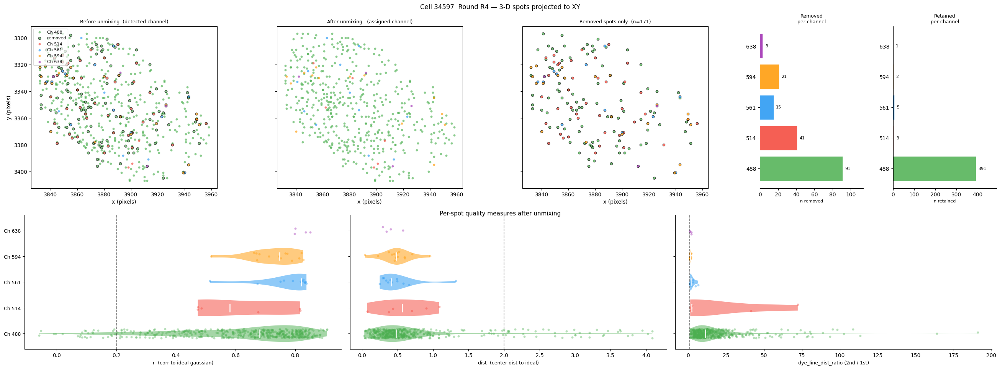


  ▸ Ch 514 retained signal — cell 33239  (155 survivors, 7.2% removal)


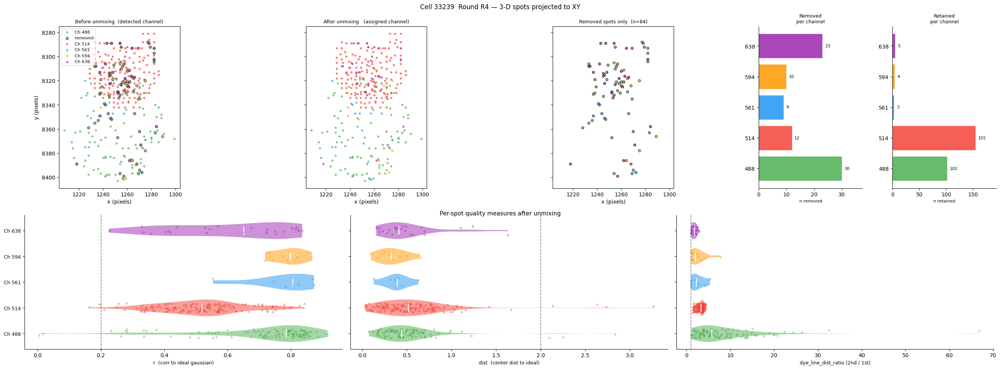


  ▸ Ch 561 retained signal — cell 31899  (349 survivors, 17.3% removal)


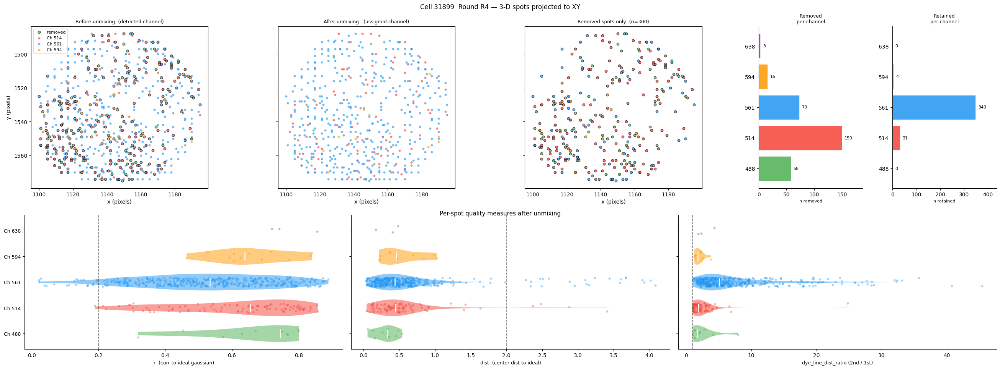


  ▸ Ch 594 retained signal — cell 22216  (293 survivors, 18.6% removal)


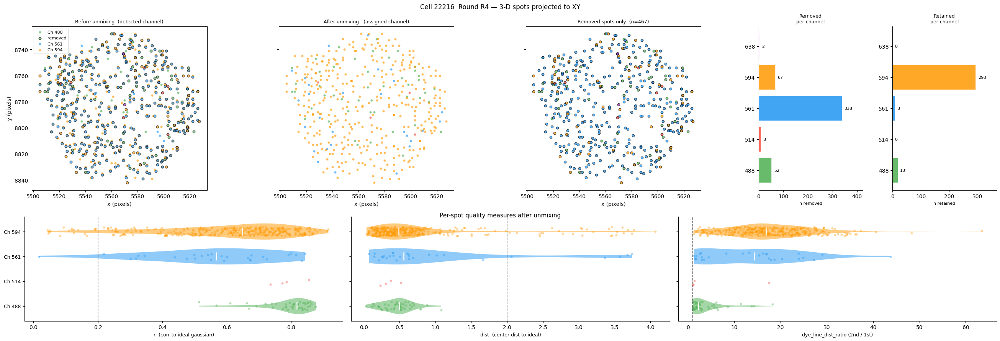


  ▸ Ch 638 retained signal — cell 21712  (387 survivors, 19.4% removal)


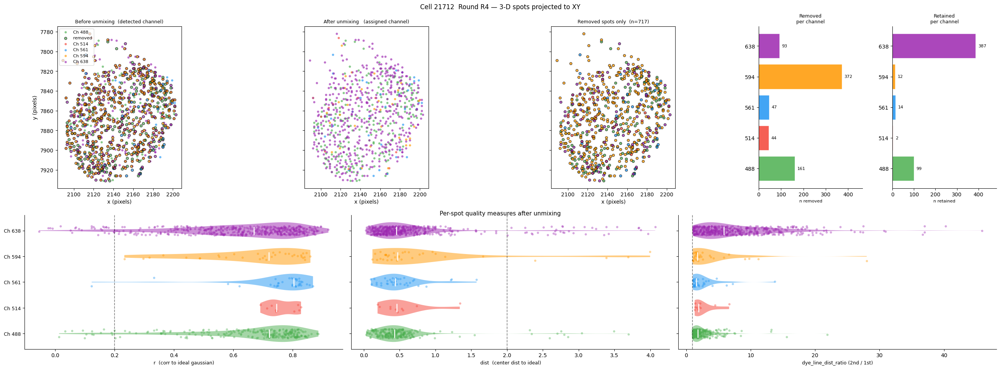


  ▸ Pair 488↔514 loss — cell 5282  (removal 488: 100.0%, 514: 100.0%)


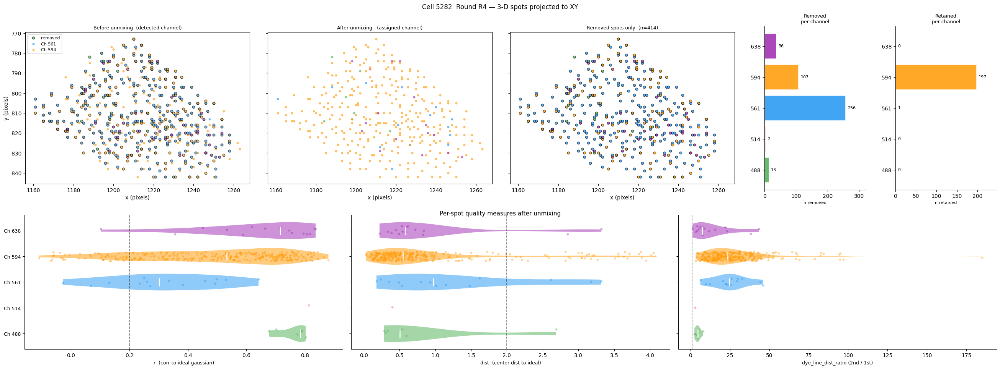

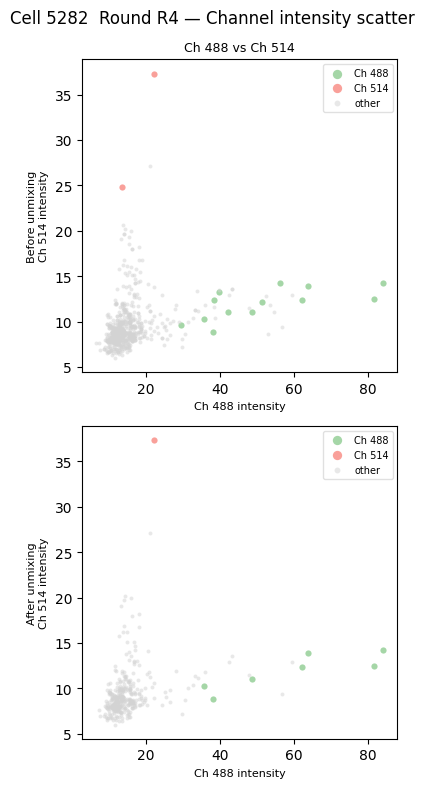


  ▸ Pair 514↔561 loss — cell 5069  (removal 514: 100.0%, 561: 100.0%)


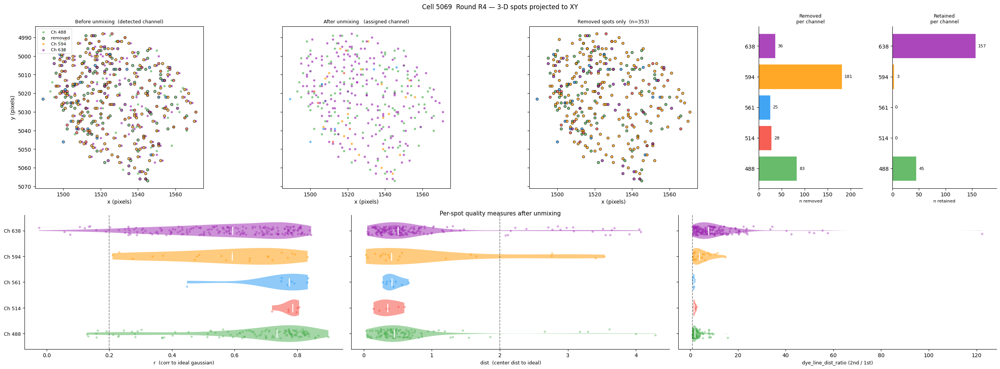

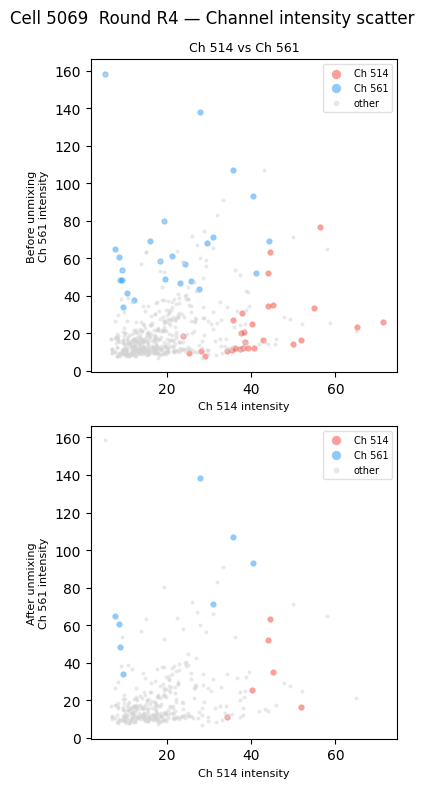


  ▸ Pair 561↔594 loss — cell 8596  (removal 561: 100.0%, 594: 100.0%)


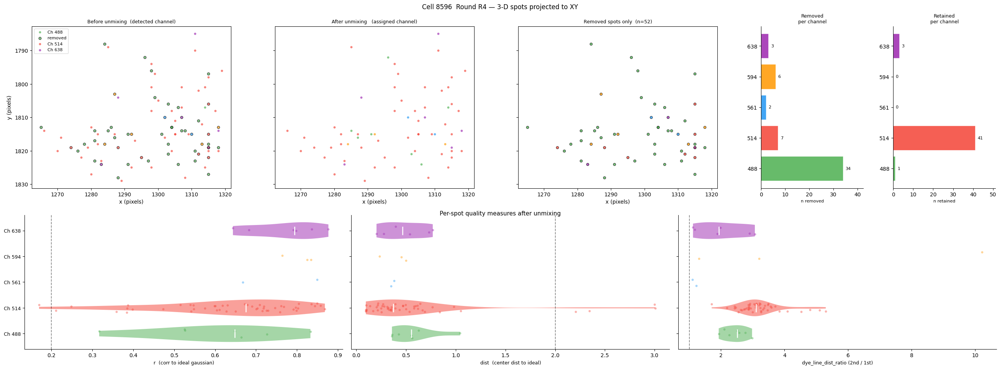

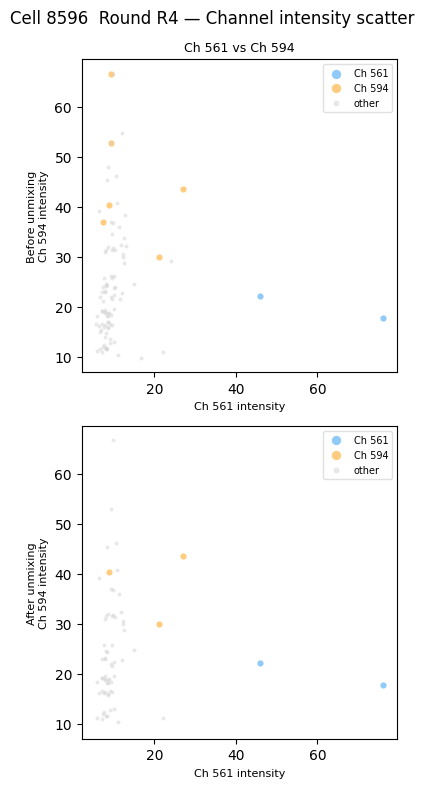


  ▸ Pair 594↔638 loss — cell 13171  (removal 594: 100.0%, 638: 100.0%)


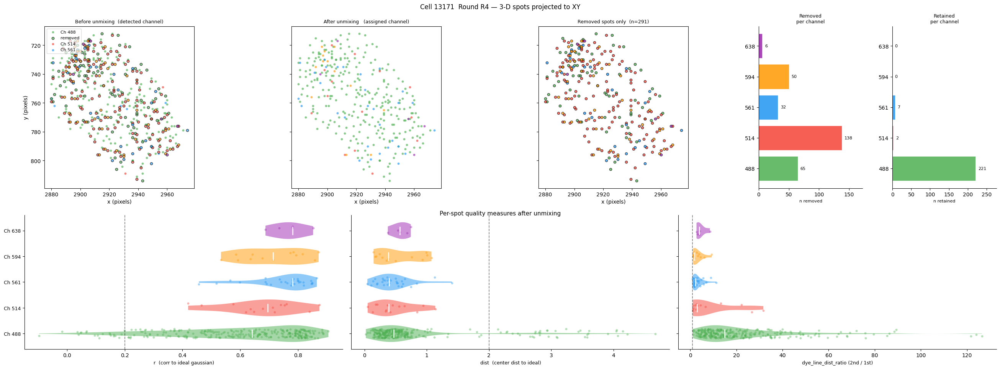

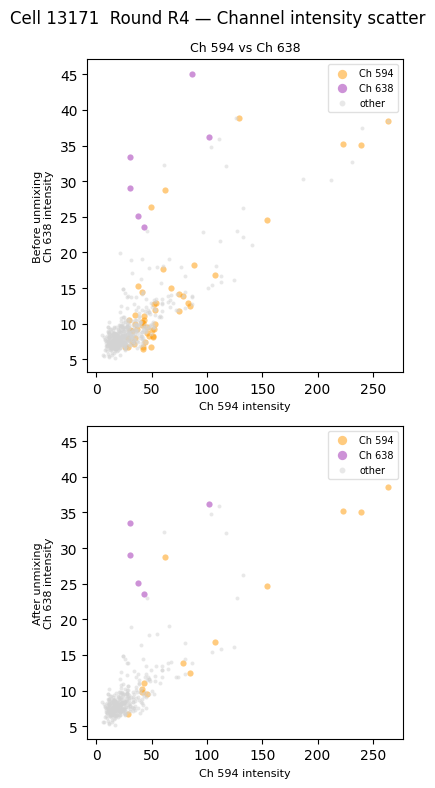


══════════════════════════════════════════════════════════════════════
  R5
══════════════════════════════════════════════════════════════════════

  ▸ Ch 488 retained signal — cell 36429  (394 survivors, 19.4% removal)


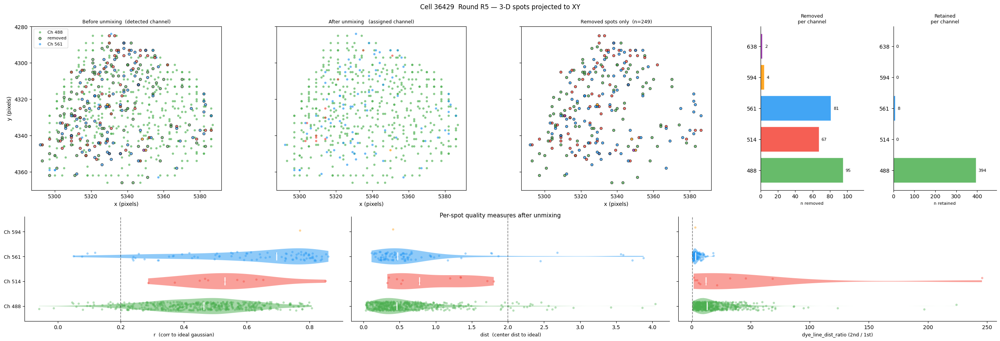


  ▸ Ch 514 retained signal — cell 34345  (863 survivors, 19.5% removal)


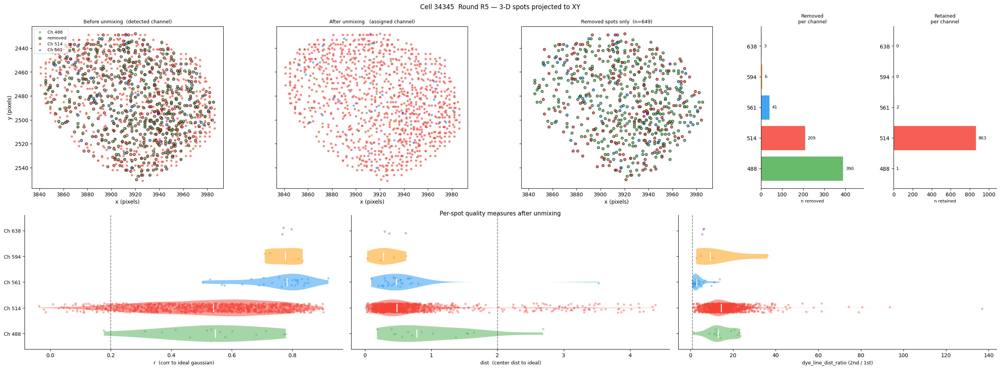


  ▸ Ch 561 retained signal — cell 7579  (621 survivors, 17.5% removal)


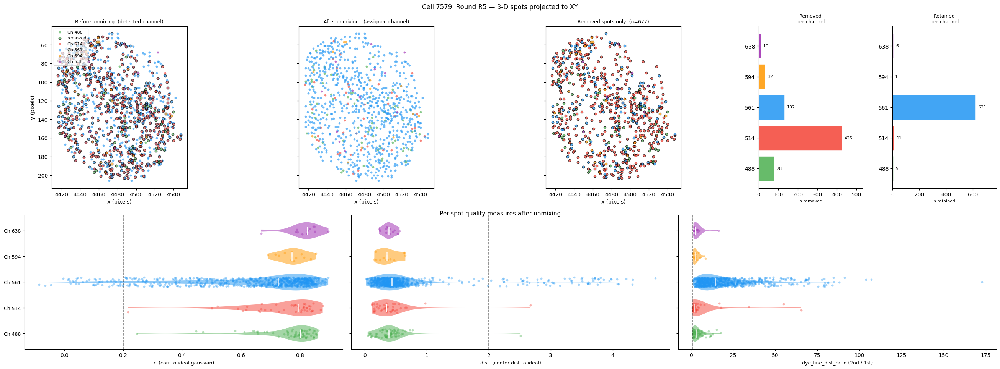


  ▸ Ch 594 retained signal — cell 13815  (346 survivors, 19.9% removal)


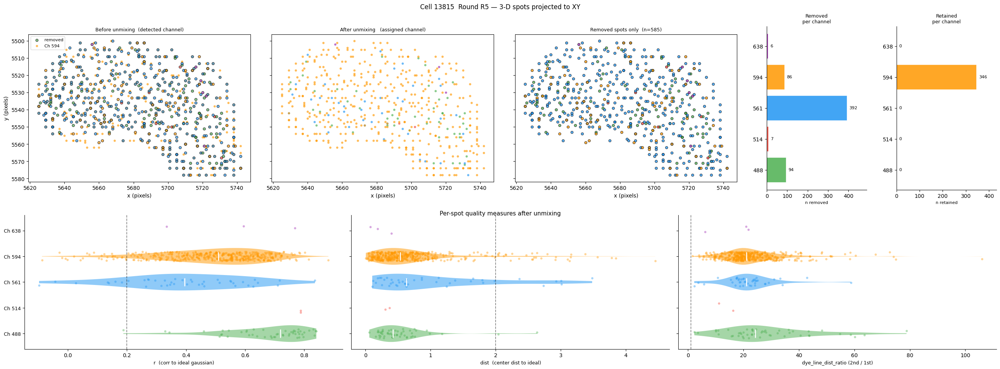


  ▸ Ch 638 retained signal — cell 32882  (420 survivors, 18.8% removal)


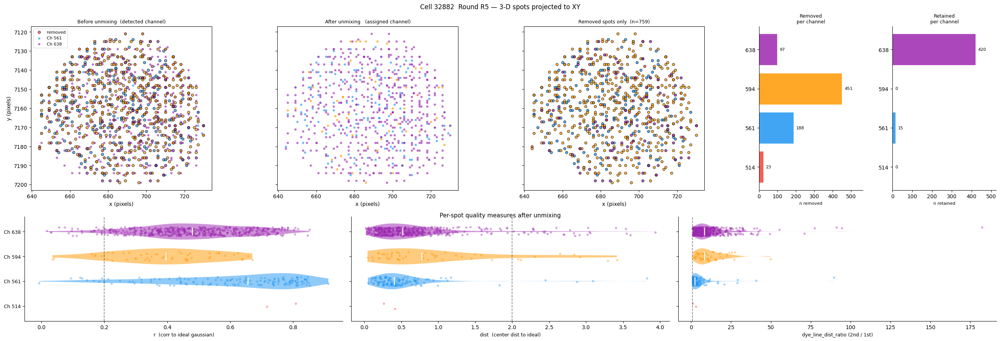


  ▸ Pair 488↔514 loss — cell 1886  (removal 488: 100.0%, 514: 100.0%)


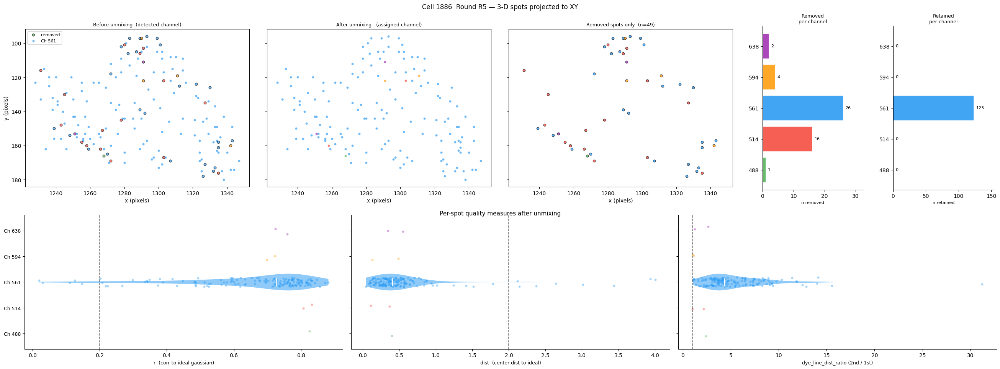

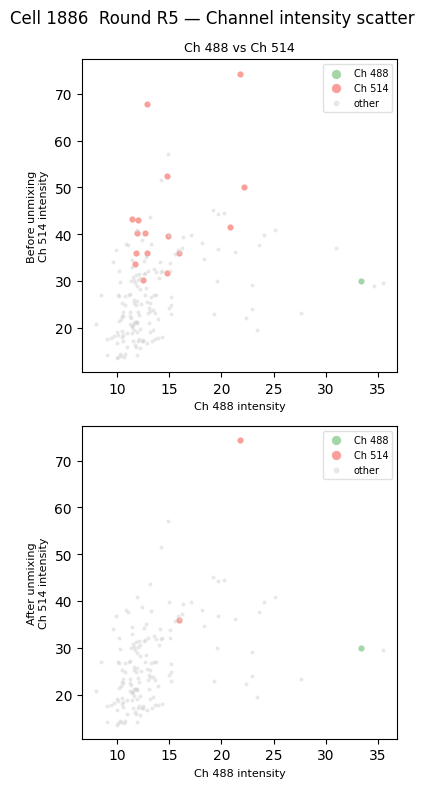


  ▸ Pair 514↔561 loss — cell 5030  (removal 514: 100.0%, 561: 100.0%)


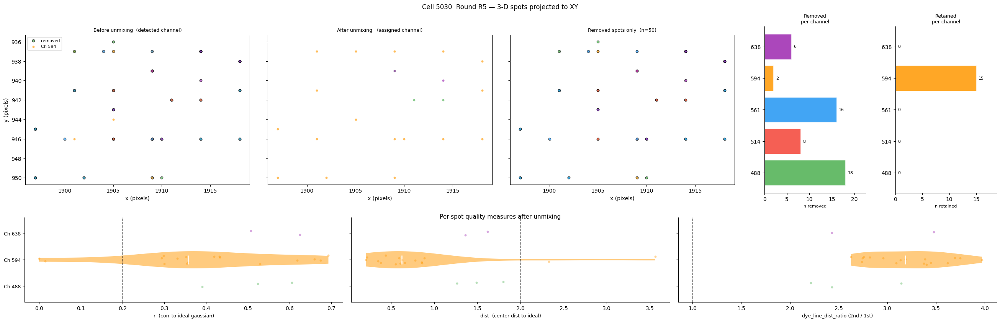

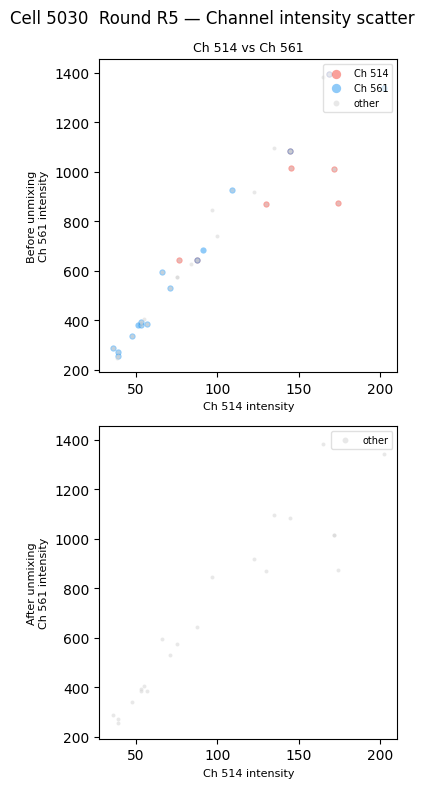


  ▸ Pair 561↔594 loss — cell 5155  (removal 561: 100.0%, 594: 100.0%)


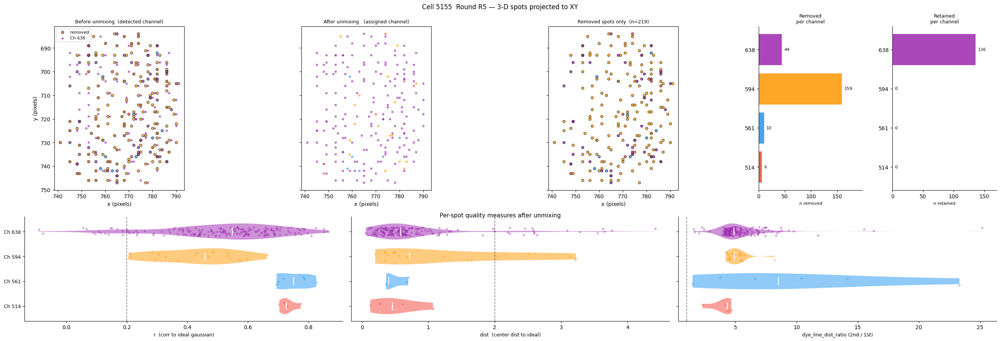

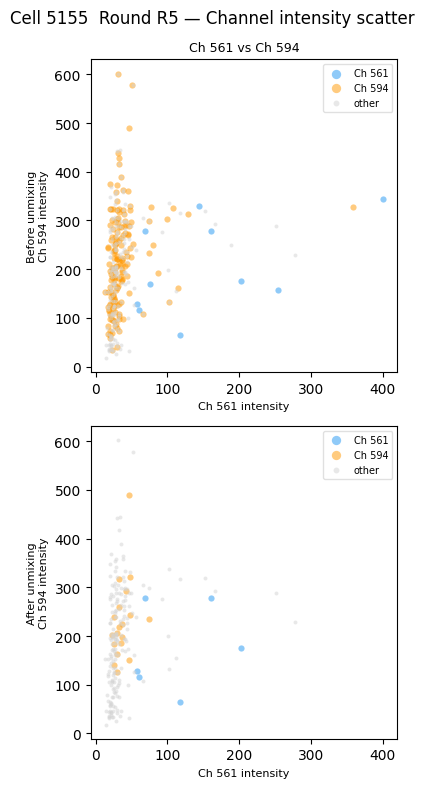


  ▸ Pair 594↔638 loss — cell 1886  (removal 594: 100.0%, 638: 100.0%)


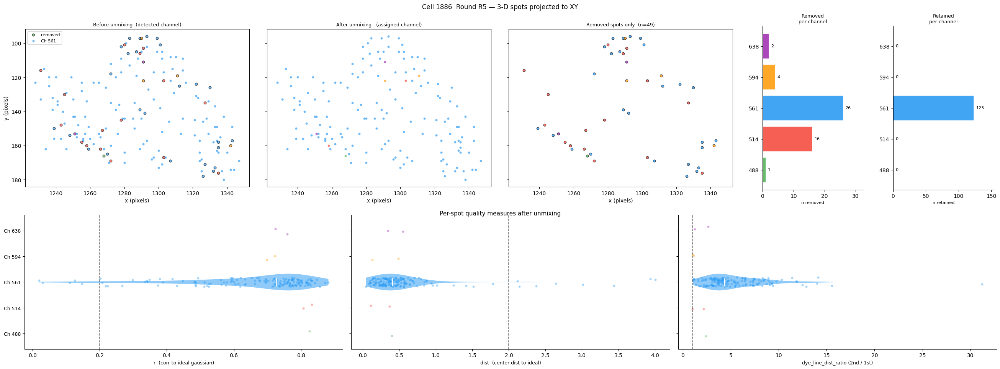

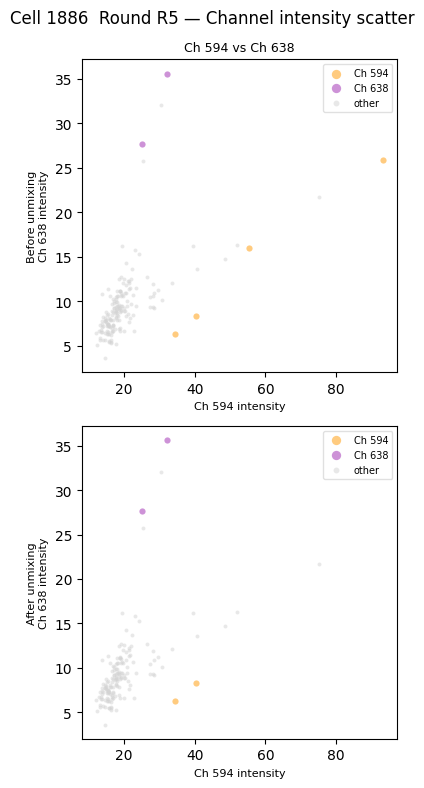

In [ ]:
# ── Run focused exemplar selection & detail plots per round ───────────────────

focused_exemplars = {}  # round_key → (retained, pair_loss)

for rk in rounds[-1:]:  # just do the last round for brevity
    summary = round_summaries[rk]
    retained, pair_loss = select_focused_exemplars(summary)
    focused_exemplars[rk] = (retained, pair_loss)

    print(f"\n{'═' * 70}")
    print(f"  {rk}")
    print(f"{'═' * 70}")

    # ── filter round data ────────────────────────────────────────────────────
    mx_rnd = mixed_ann[mixed_ann["round"] == rk]
    um_rnd = unmixed_ann[unmixed_ann["round"] == rk]

    # ── retained signal exemplars ────────────────────────────────────────────
    for ch, cid in retained.items():
        row = summary[summary["cell_id"] == cid].iloc[0]
        n_surv = int(row.get(f"n_unmixed_{ch}", 0))
        rr = row.get(f"removal_rate_{ch}", 0)
        print(f"\n  ▸ Ch {ch} retained signal — cell {cid}  "
              f"({n_surv} survivors, {rr:.1%} removal)")

        m_cell = mx_rnd[mx_rnd["cell_id"] == cid]
        u_cell = um_rnd[um_rnd["cell_id"] == cid]

        plot_cell_qc(
            m_cell, u_cell, cell_id=cid, round_key=rk,
            chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
        )
        plt.show()

    # ── pair loss exemplars ──────────────────────────────────────────────────
    for (a, b), cid in pair_loss.items():
        row = summary[summary["cell_id"] == cid].iloc[0]
        ra = row.get(f"removal_rate_{a}", 0)
        rb = row.get(f"removal_rate_{b}", 0)
        print(f"\n  ▸ Pair {a}↔{b} loss — cell {cid}  "
              f"(removal {a}: {ra:.1%}, {b}: {rb:.1%})")

        m_cell = mx_rnd[mx_rnd["cell_id"] == cid]
        u_cell = um_rnd[um_rnd["cell_id"] == cid]

        # spot projection + quality measures
        plot_cell_qc(
            m_cell, u_cell, cell_id=cid, round_key=rk,
            chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
        )
        plt.show()

        # adjacent channel scatter focused on this pair
        plot_adjacent_channel_scatter(
            m_cell, u_cell, cell_id=cid, round_key=rk,
            chan_order=CHAN_ORDER, chan_colors=CHAN_COLORS,
            pairs=[(a, b)],
        )
        plt.show()

In [28]:
focused_exemplars

{'R4': ({'488': 34597, '514': 33239, '561': 31899, '594': 22216, '638': 21712},
  {('488', '514'): 5282,
   ('514', '561'): 5069,
   ('561', '594'): 8596,
   ('594', '638'): 13171}),
 'R5': ({'488': 36429, '514': 34345, '561': 7579, '594': 13815, '638': 32882},
  {('488', '514'): 1886,
   ('514', '561'): 5030,
   ('561', '594'): 5155,
   ('594', '638'): 1886})}

Testing plot_cell_qc — round R5, cell 1886
 mixed spots: 172, unmixed spots: 156


/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)



1-NN cross-channel distance summary  ((x×y×z, pixels)):
     Direction      n    median      mean       std       min       max
     561 → 514    149    28.337    30.458    14.815     4.583    67.772
     561 → 594    149    38.936    37.162    16.112     7.280    70.093

   Ch       n   med_ratio   med_z_int   med_score   % score>1
  488       1       2.805       -0.85       5.199      100.0%
  514       2       1.570       -0.39       2.102      100.0%
  561     149       0.232       -0.64       0.372        6.0%
  594       2       0.912       -0.68       1.537      100.0%
  638       2       2.068       -0.95       3.950      100.0%


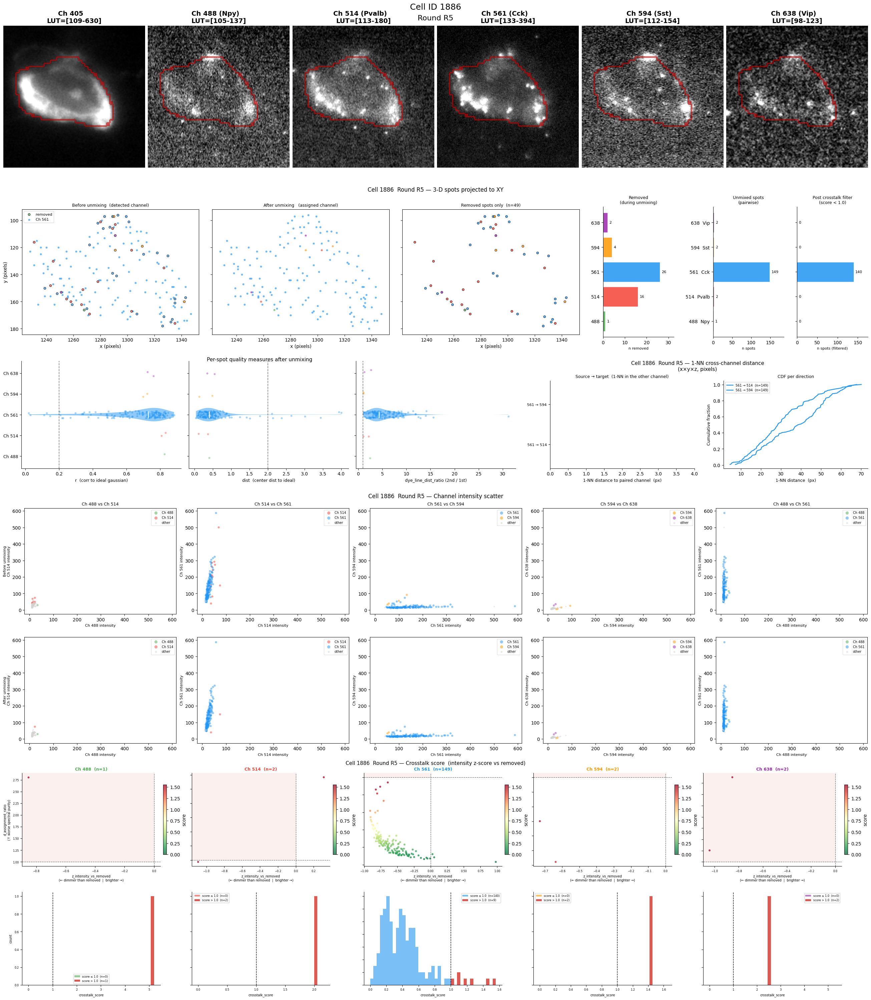

In [30]:
_test_rk = rounds[-1]
_retained, _pair_loss = focused_exemplars[_test_rk]

_test_cid = next(iter(_retained.values()))

_test_cid = 1886

_mx = mixed_ann[(mixed_ann["round"] == _test_rk) & (mixed_ann["cell_id"] == _test_cid)]
_um = unmixed_ann[(unmixed_ann["round"] == _test_rk) & (unmixed_ann["cell_id"] == _test_cid)]

print(f"Testing plot_cell_qc — round {_test_rk}, cell {_test_cid}")
print(f" mixed spots: {len(_mx)}, unmixed spots: {len(_um)}")
#print(f" crosstalk cols present: {{'crosstalk_score','d_assignment_ratio','z_intensity_vs_removed'}.issubset(_um.columns)}")

plot_cell_qc( _mx, _um, cell_id=_test_cid, round_key=_test_rk, chan_order=CHAN_ORDER, spots_df=_um,chan_colors=CHAN_COLORS, dataset=dataset, scatter_pairs=ADJACENT_PAIRS + [("488", "561")])


Testing plot_cell_qc — round R5, cell 5155
 mixed spots: 355, unmixed spots: 210


/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)



1-NN cross-channel distance summary  ((x×y×z, pixels)):
     Direction      n    median      mean       std       min       max
     514 → 561      5    23.000    19.070     5.190    11.358    23.622
     561 → 514      6    15.063    15.693     2.927    11.358    19.824
     561 → 594      6     7.999     7.725     2.120     4.243    11.000
     594 → 561     19    11.832    12.973     5.410     4.243    24.062
     594 → 638     19     3.606     3.644     0.786     2.236     5.099
     638 → 594    180     8.124     8.539     3.682     2.236    19.950

   Ch       n   med_ratio   med_z_int   med_score   % score>1
  514       5       4.835       -0.71       8.100      100.0%
  561       6       9.826       -0.75      18.272      100.0%
  594      19       4.907        2.19       4.907      100.0%
  638     180       0.206        6.87       0.195        1.1%


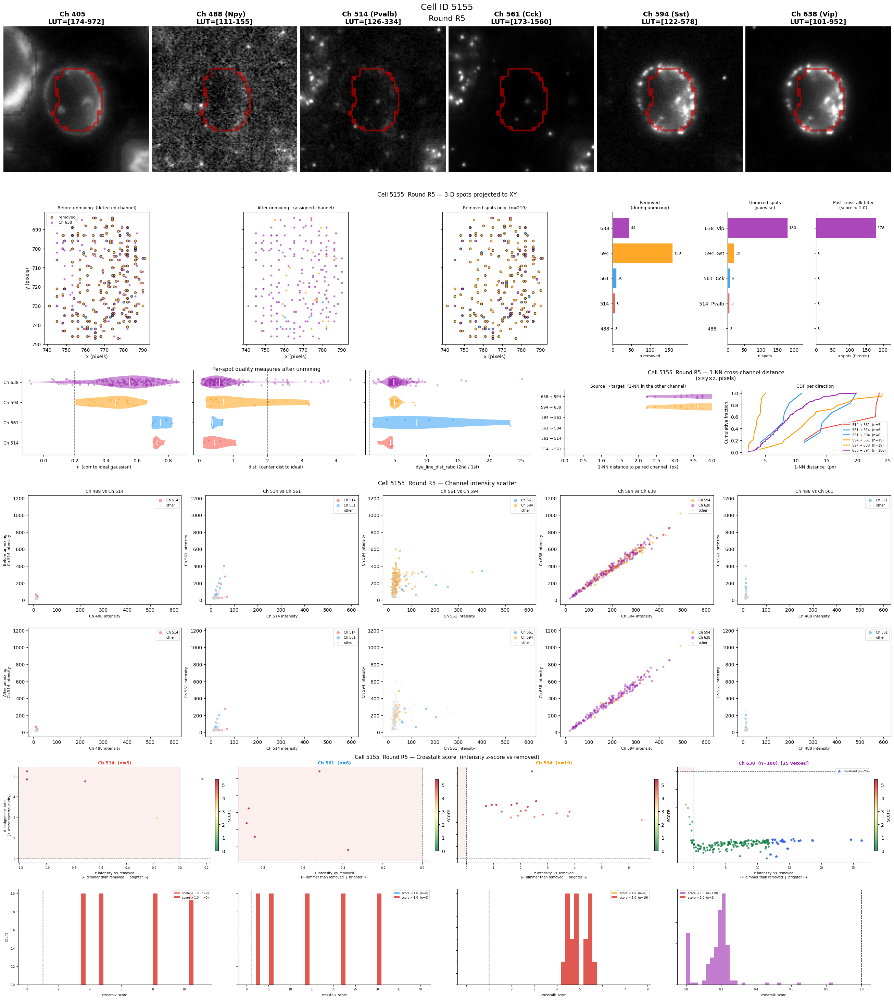

In [32]:
_test_rk = rounds[-1]
_retained, _pair_loss = focused_exemplars[_test_rk]

_test_cid = next(iter(_retained.values()))

_test_cid = 5155

_mx = mixed_ann[(mixed_ann["round"] == _test_rk) & (mixed_ann["cell_id"] == _test_cid)]
_um = unmixed_ann[(unmixed_ann["round"] == _test_rk) & (unmixed_ann["cell_id"] == _test_cid)]

print(f"Testing plot_cell_qc — round {_test_rk}, cell {_test_cid}")
print(f" mixed spots: {len(_mx)}, unmixed spots: {len(_um)}")
#print(f" crosstalk cols present: {{'crosstalk_score','d_assignment_ratio','z_intensity_vs_removed'}.issubset(_um.columns)}")

plot_cell_qc( _mx, _um, cell_id=_test_cid, round_key=_test_rk, chan_order=CHAN_ORDER, spots_df=_um,chan_colors=CHAN_COLORS, dataset=dataset, scatter_pairs=ADJACENT_PAIRS + [("488", "561")])


Testing plot_cell_qc — round R5, cell 7579
 mixed spots: 1321, unmixed spots: 892


/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)



1-NN cross-channel distance summary  ((x×y×z, pixels)):
     Direction      n    median      mean       std       min       max
     488 → 514     72    12.083    12.869     5.589     3.317    35.256
     514 → 488     43    10.050    11.927     6.039     3.317    27.659
     514 → 561     43     5.196     5.498     2.175     2.236    13.153
     561 → 514    752    13.342    14.089     6.295     2.236    43.509
     561 → 594    752    20.273    20.879     8.450     2.236    43.784
     594 → 561     13     4.583     5.074     2.224     2.236    10.630
     594 → 638     13    22.113    21.222     6.085    13.038    31.448
     638 → 594     12    19.782    21.361     7.362    13.038    36.715

   Ch       n   med_ratio   med_z_int   med_score   % score>1
  488      72       3.111       -0.29       4.469       93.1%
  514      43       1.339       -0.01       1.717       74.4%
  561     752       0.070        0.09       0.072        0.4%
  594      13       2.630       -0.59       3.

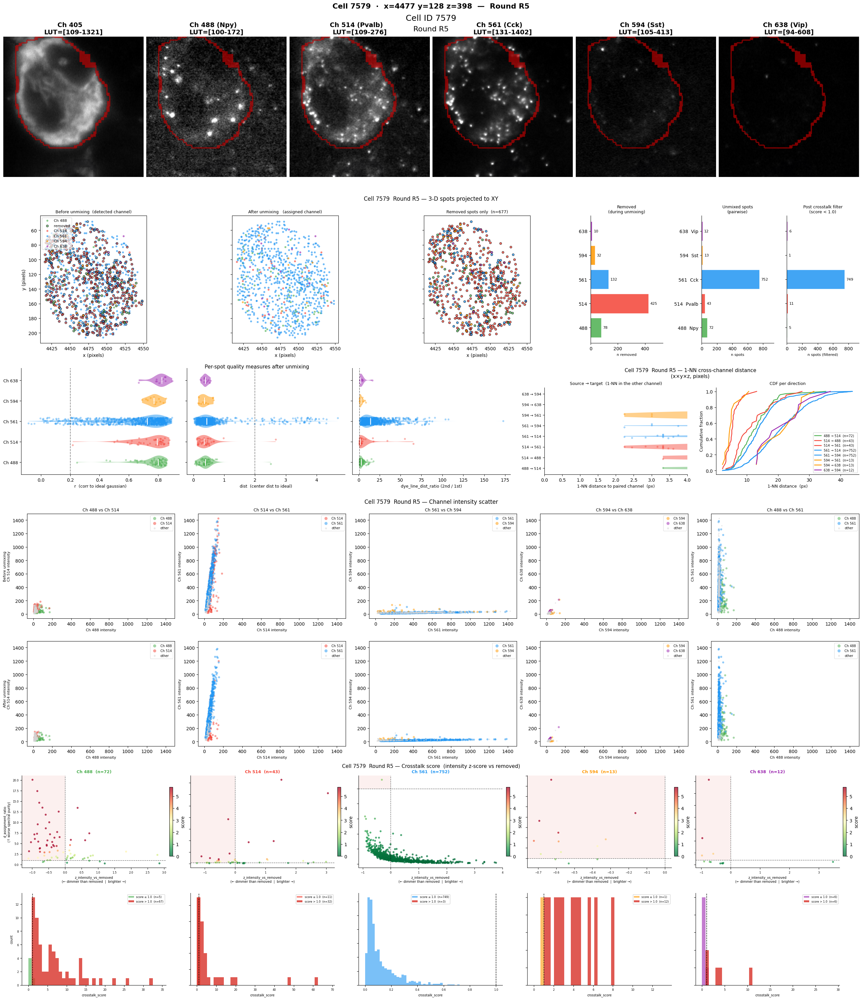

In [35]:
_test_rk = rounds[-1]
_retained, _pair_loss = focused_exemplars[_test_rk]

_test_cid = next(iter(_retained.values()))

_test_cid = 7579

_mx = mixed_ann[(mixed_ann["round"] == _test_rk) & (mixed_ann["cell_id"] == _test_cid)]
_um = unmixed_ann[(unmixed_ann["round"] == _test_rk) & (unmixed_ann["cell_id"] == _test_cid)]

print(f"Testing plot_cell_qc — round {_test_rk}, cell {_test_cid}")
print(f" mixed spots: {len(_mx)}, unmixed spots: {len(_um)}")
#print(f" crosstalk cols present: {{'crosstalk_score','d_assignment_ratio','z_intensity_vs_removed'}.issubset(_um.columns)}")

plot_cell_qc( _mx, _um, cell_id=_test_cid, round_key=_test_rk, chan_order=CHAN_ORDER, spots_df=_um,chan_colors=CHAN_COLORS, dataset=dataset, scatter_pairs=ADJACENT_PAIRS + [("488", "561")])


Testing plot_cell_qc — round R5, cell 36429
 mixed spots: 651, unmixed spots: 586


/src/aind-hcr-data-loader/src/aind_hcr_data_loader/hcr_dataset.py:464: UserWarning: Getting cell info from cell x gene file. Does not include all segmentation masks; but this is usually fine.
  warnings.warn(
/opt/conda/lib/python3.12/site-packages/zarr/core/metadata/v2.py:190: ZarrUserWarning: Found an empty list of filters in the array metadata document. This is contrary to the Zarr V2 specification, and will cause an error in the future. Use None (or Null in a JSON document) instead of an empty list of filters.
  warnings.warn(msg, ZarrUserWarning, stacklevel=1)



   Ch       n   med_ratio   med_z_int   med_score   % score>1
  488     489       0.076        8.54       0.046        0.4%
  514      11      12.336        3.99      12.336      100.0%
  561      85       3.542       -0.56       5.205       90.6%
  594       1       3.337       -0.36       4.547      100.0%


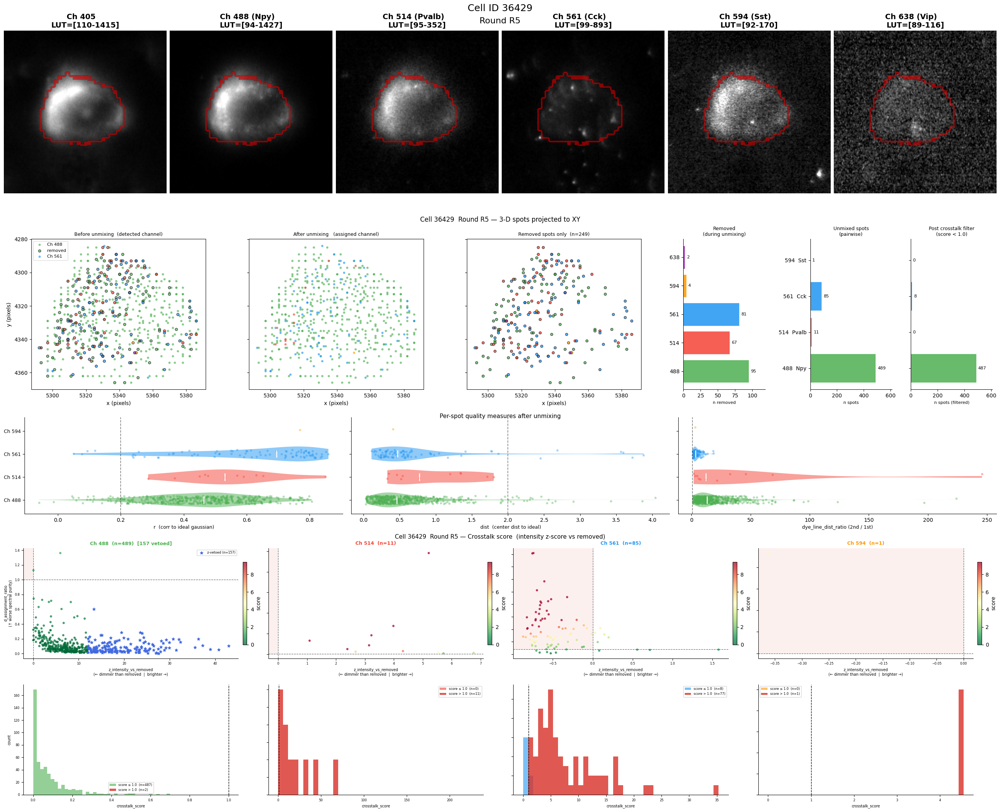

In [ ]:
_test_rk = rounds[-1]
_retained, _pair_loss = focused_exemplars[_test_rk]

_test_cid = next(iter(_retained.values()))

_mx = mixed_ann[(mixed_ann["round"] == _test_rk) & (mixed_ann["cell_id"] == _test_cid)]
_um = unmixed_ann[(unmixed_ann["round"] == _test_rk) & (unmixed_ann["cell_id"] == _test_cid)]

print(f"Testing plot_cell_qc — round {_test_rk}, cell {_test_cid}")
print(f" mixed spots: {len(_mx)}, unmixed spots: {len(_um)}")
#print(f" crosstalk cols present: {{'crosstalk_score','d_assignment_ratio','z_intensity_vs_removed'}.issubset(_um.columns)}")

plot_cell_qc( _mx, _um, cell_id=_test_cid, round_key=_test_rk, chan_order=CHAN_ORDER, spots_df=_um,chan_colors=CHAN_COLORS, dataset=dataset, )